# Compare differences between GEBCO versions

https://www.gebco.net/data_and_products/gridded_bathymetry_data/

In [1]:
import cmocean
import warnings
import cartopy.crs as ccrs
from cartopy import feature as cfeature
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib import colors

from oceanum.datamesh import Connector

plt.rcParams["figure.figsize"] = [20, 10]
warnings.filterwarnings("ignore")

# Read data

## Connect to datamesh
Define your datamesh token in evironment variables as DATAMESH_TOKEN or insert into argument below.

In [2]:
conn = Connector(token=None)

Using datamesh API version 0
You are using version 1.0.12 of oceanum_python which is the latest version available.


Wrap the Datamesh query in a function

In [3]:
def read_gebco(year: int, bbox, step=1) -> xr.Dataset:
    """Query and downsample gebco data from datamesh within a bounding box.

    Parameters
    ----------
    year : int
        The year of the gebco data.
    bbox : tuple
        The bounding box to query.
    step : int
        The step to use when subsampling the data.

    Returns
    -------
    xr.Dataset
        The dataset containing the gebco data.

    """
    query = {
        "datasource": f"gebco_{year}",
        "variables": ["elevation"],
        "geofilter": {"type": "bbox", "geom": bbox},
    }
    return conn.query(query).isel(lon=slice(None, None, step), lat=slice(None, None, step))


def read_all_gebco_versions(bbox: list, years: list, step_15sec: int) -> xr.Dataset:
    """Read all gebco versions from datamesh at a common resolution.

    Parameters
    ----------
    bbox : list
        The bounding box to query.
    years : list
        The years of the gebco data.
    step_15sec : int
        The step to use when subsampling the highest-resolution, 15-second data.

    Returns
    -------
    xr.Dataset
        A dataset containing the gebco subsets for each year.

    """
    data = []
    for year in years:
        print(year)
        # Years 2008 and 2014 have lower resolution than other years
        if year == 2008:
            step = int(step_15sec / 4)
        elif year == 2014:
            step = int(step_15sec / 2)
        else:
            step = step_15sec
        # Read the gebco data for this year
        dset = read_gebco(year=year, step=step, bbox=bbox)
        # Interpolate to make sure coordinates match
        if len(data) > 0:
            dset = dset.interp_like(data[0])
        data.append(dset)
    # Append each dataset along a new dimension
    dset = xr.concat(data, dim="year")
    dset["year"] = years
    return dset

## Compare GEBCO New Zealand

Read and compare the different versions of the GEBCO data around New Zealand, downsampled to 2 arc minutes.

In [4]:
# Years of GEBCO releases
years = [2008, 2014, 2019, 2020, 2021, 2022, 2023, 2024, 2025]

# bounding box around New Zealand
bbox = [165, -50, 180, -33]

# Subset the 15-sec data by a factor of 16 so we have 2 minute resolution
step_15sec = 16

# Read all GEBCO versions
dset = read_all_gebco_versions(bbox=bbox, years=years, step_15sec=step_15sec)

dset

2008
2014
2019
2020
2021
2022
2023
2024
2025


<xarray.Dataset> Size: 4MB
Dimensions:    (year: 9, lat: 256, lon: 226)
Coordinates:
  * lat        (lat) float64 2kB -50.0 -49.93 -49.87 ... -33.13 -33.07 -33.0
  * lon        (lon) float64 2kB 165.0 165.1 165.1 165.2 ... 179.9 179.9 180.0
  * year       (year) int64 72B 2008 2014 2019 2020 2021 2022 2023 2024 2025
Data variables:
    elevation  (year, lat, lon) float64 4MB -3.631e+03 -3.582e+03 ... nan nan
Attributes:
    Conventions:    CF-1.6
    comment:        The data in the GEBCO One Minute Grid should not be used ...
    history:        This is version 2.0 of the data set, released in November...
    institution:    On behalf of the General Bathymetric Chart of the Oceans ...
    node_offset:    0
    references:     Information on the data set is available from the interne...
    source:         The grid is largely based on the bathymetric contours con...
    title:          The GEBCO One Minute Grid - a continuous terrain model fo...
    _coordinates:   {"x":"lon","y":"lat"}
    _request_size:  7374744
    _domain_size:   919921

### Elevations 2008 against 2025

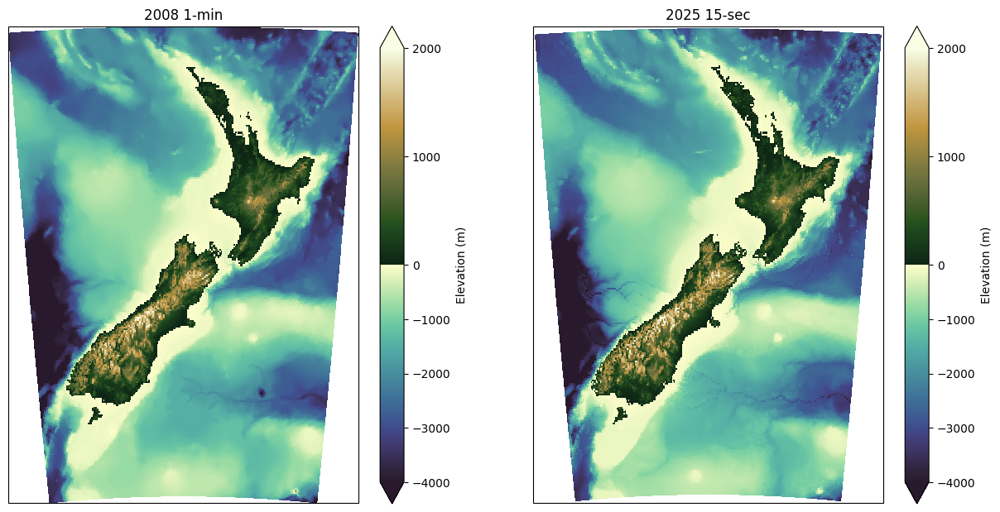

In [5]:
projection = ccrs.TransverseMercator(central_longitude=(float(dset.lon.mean())))
transform = ccrs.PlateCarree()

norm = colors.TwoSlopeNorm(vmin=-4000, vmax=2000, vcenter=0)

figsize = (15, 7.5)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize, subplot_kw={"projection": projection})

# 2008
ds = dset.sel(year=2008).elevation
ds.plot(ax=ax1, cmap=cmocean.cm.topo, transform=transform, norm=norm, cbar_kwargs={"label": "Elevation (m)"})
t = ax1.set_title("2008 1-min")

# 2025
ds = dset.sel(year=2025).elevation
ds.plot(ax=ax2, cmap=cmocean.cm.topo, transform=transform, norm=norm, cbar_kwargs={"label": "Elevation (m)"})
t = ax2.set_title("2025 15-sec")

### Differences

In [6]:
def plot_difference(dset, year1, year2, levels=[-500], step=1, vmax1=100, vmax2=10, figsize=None):
    """Plot absolute and percentage differences between 2 grids."""

    ds1 = dset.sel(year=year1).elevation
    ds2 = dset.sel(year=year2).elevation.interp_like(ds1)

    # Downsampling
    ds1 = ds1.isel(lon=slice(None, None, step), lat=slice(None, None, step))
    ds2 = ds2.isel(lon=slice(None, None, step), lat=slice(None, None, step))

    xmin, xmax = ds1.lon.values[[0, -1]]
    ymin, ymax = ds1.lat.values[[0, -1]]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize, subplot_kw={"projection": projection})

    # Absolute difference
    ds = ds2 - ds1
    ds.plot(ax=ax1, vmin=-vmax1, vmax=vmax1, cmap="RdBu_r", transform=transform, cbar_kwargs={"label": "Absolute difference (m)"});
    levs = np.arange(-100, 110, 10)
    c = ds2.plot.contour(ax=ax1, colors="gray", linewidths=1, linestyles="-", levels=levels, transform=transform)
    c.clabel(fmt="%0.0f m", fontsize=8)
    ax1.coastlines(linewidth=2)
    ax1.set_title("Absolute")
    ax1.set_extent([xmin, xmax, ymin, ymax])

    # Percentage difference
    ds = 100 * (ds2 - ds1) / ds1
    ds.plot(ax=ax2, vmin=-vmax2, vmax=vmax2, cmap="RdBu_r", transform=transform, cbar_kwargs={"label": "Percentage difference (%)"});
    levs = np.arange(-10, 11, 1)
    c = ds2.plot.contour(ax=ax2, colors="gray", linewidths=1, linestyles="-", levels=levels, transform=transform)
    c.clabel(fmt="%0.0f m", fontsize=8)
    ax2.coastlines(linewidth=2)
    ax2.set_title("Percentage")
    ax2.set_extent([xmin, xmax, ymin, ymax])

In [7]:
# Subset it further for plot if needed

step = 1

#### 2008 vs 2025

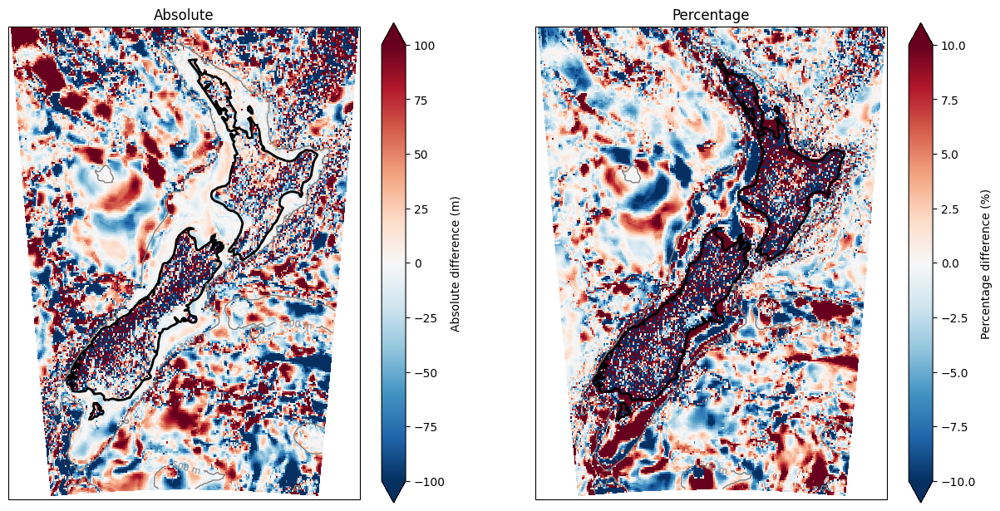

In [8]:
plot_difference(dset, 2008, 2025, step=step, figsize=figsize)

#### 2008 vs 2014

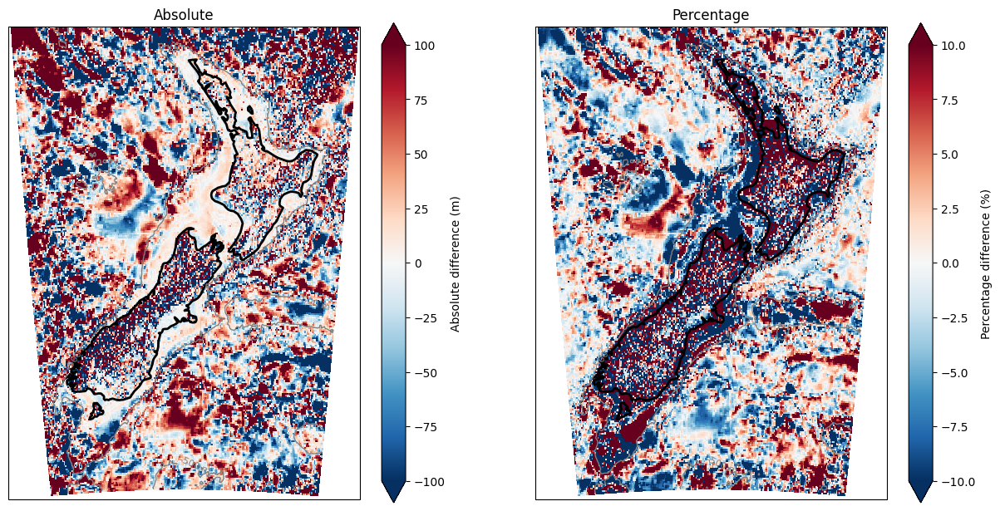

In [9]:
plot_difference(dset, 2008, 2014, step=step, figsize=figsize)

#### 2014 vs 2019

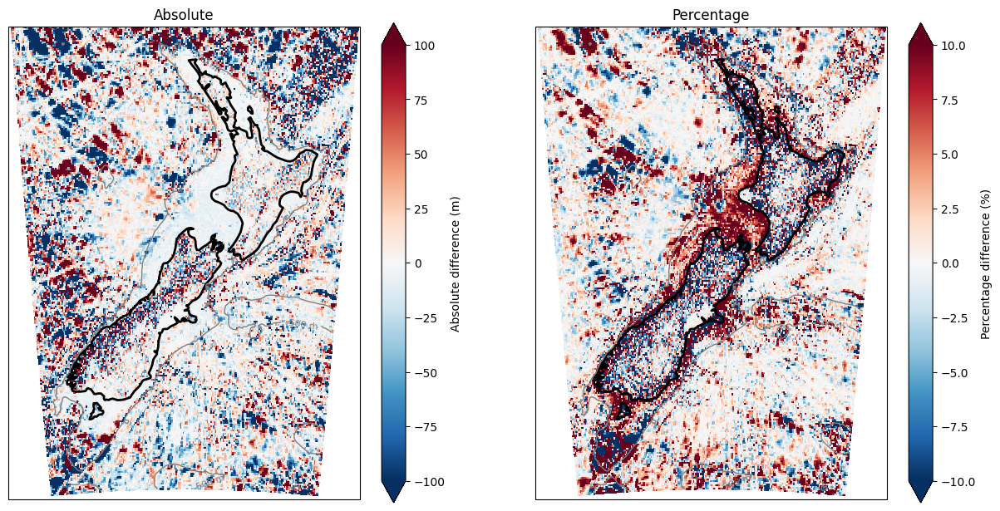

In [10]:
plot_difference(dset, 2014, 2019, step=step, figsize=figsize)

#### 2019 vs 2020

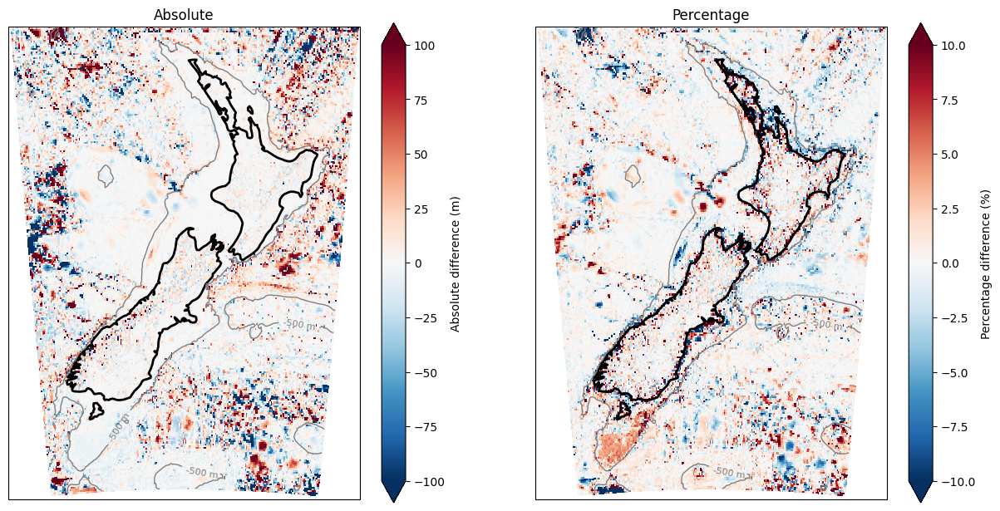

In [11]:
plot_difference(dset, 2019, 2020, step=step, figsize=figsize)

#### 2020 vs 2021

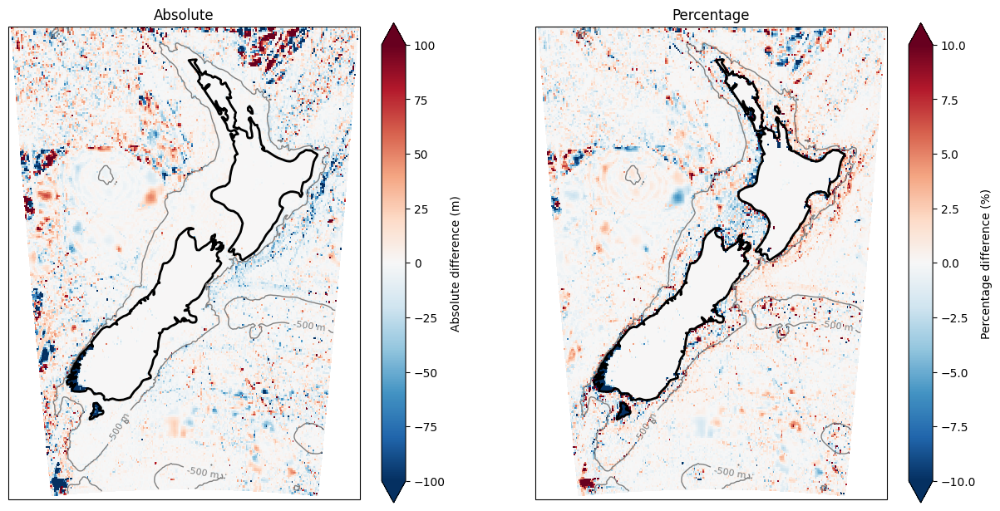

In [12]:
plot_difference(dset, 2020, 2021, step=step, figsize=figsize)

#### 2021 vs 2022

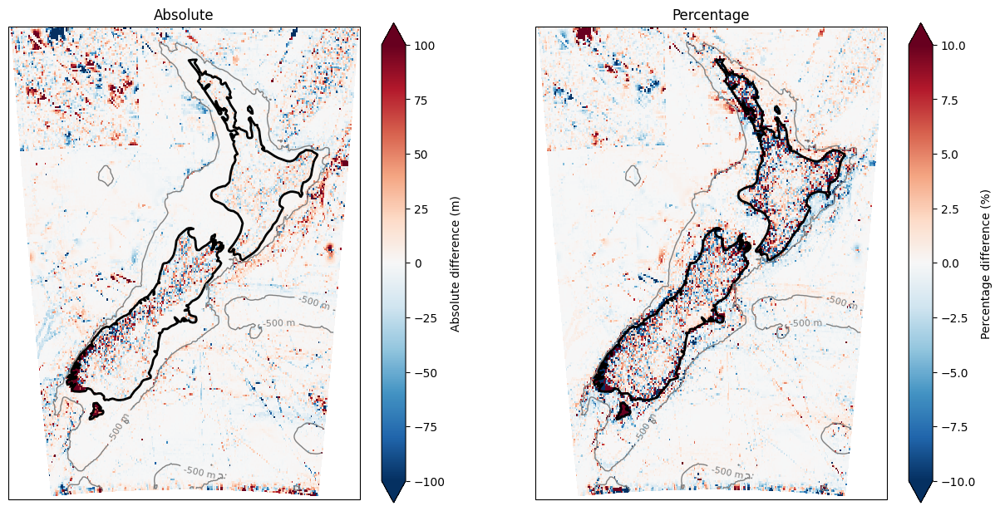

In [13]:
plot_difference(dset, 2021, 2022, step=step, figsize=figsize)

#### 2022 vs 2023

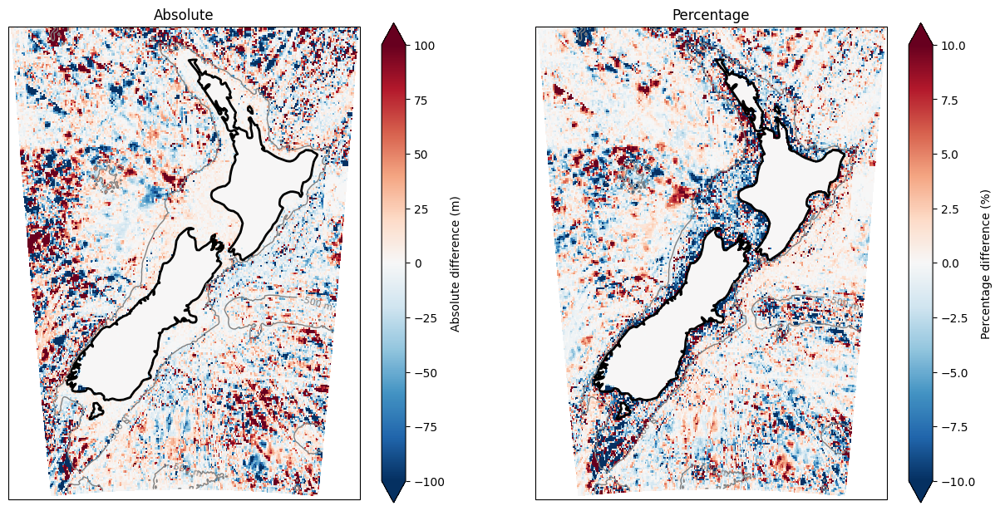

In [14]:
plot_difference(dset, 2022, 2023, step=step, figsize=figsize)

#### 2023 vs 2024

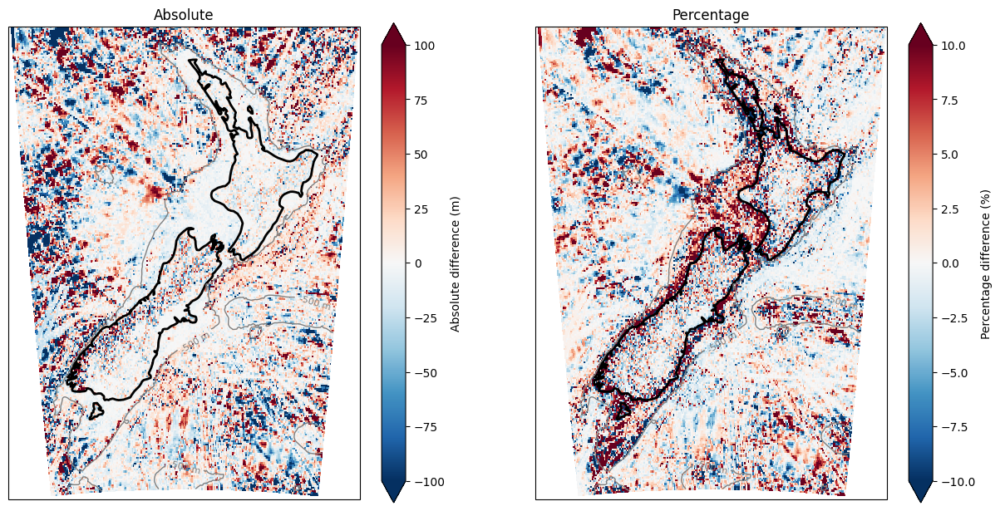

In [15]:
plot_difference(dset, 2023, 2024, step=step, figsize=figsize)

#### 2024 vs 2025

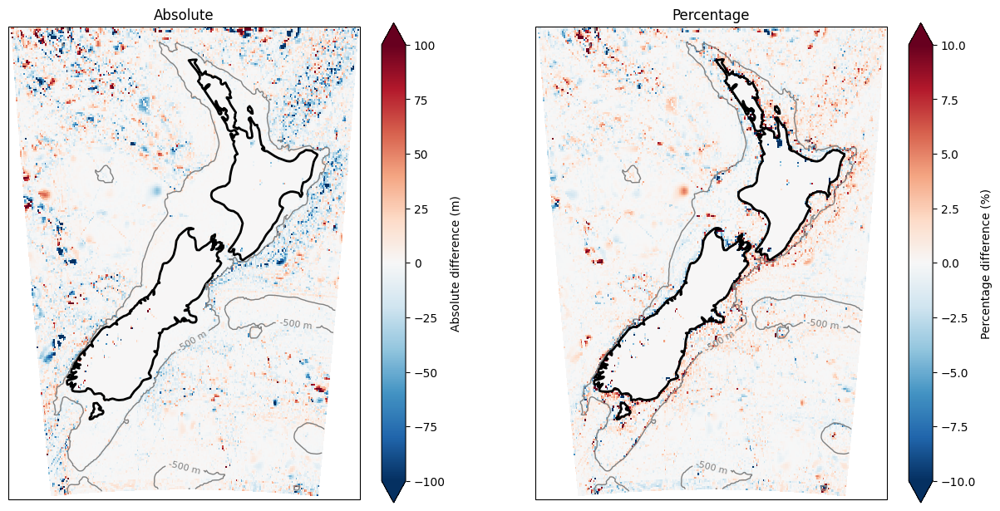

In [16]:
plot_difference(dset, 2024, 2025, step=step, figsize=figsize)

## Compare GEBCO Western Europe

Read and compare the different versions of the GEBCO data around Western Europe

In [17]:
# bounding box around New Zealand
bbox = [-11, 48.5, 13, 61]

# Read all GEBCO versions
dset = read_all_gebco_versions(bbox=bbox, years=years, step_15sec=step_15sec)

2008
2014
2019
2020
2021
2022
2023
2024
2025


### Elevations 2008 against 2025

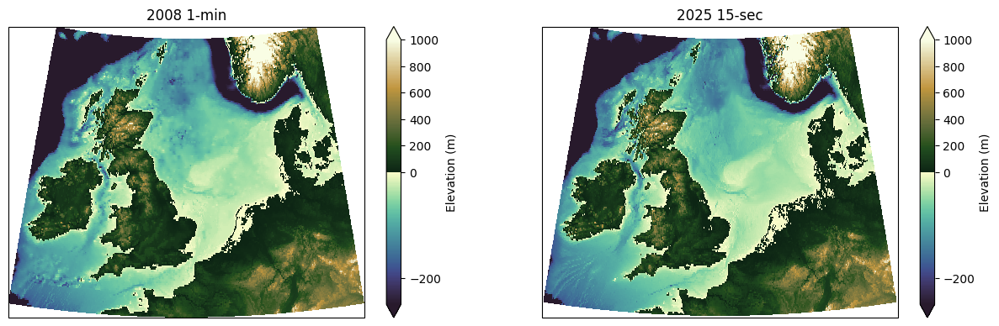

In [18]:
projection = ccrs.TransverseMercator(central_longitude=(float(dset.lon.mean())))
transform = ccrs.PlateCarree()

figsize = (15, 4.5)

norm = colors.TwoSlopeNorm(vmin=-250, vmax=1000, vcenter=0)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize, subplot_kw={"projection": projection})

# 2008
ds = dset.sel(year=2008).elevation
ds.plot(ax=ax1, cmap=cmocean.cm.topo, transform=transform, norm=norm, cbar_kwargs={"label": "Elevation (m)"})
t = ax1.set_title("2008 1-min")

# 2025
ds = dset.sel(year=2025).elevation
ds.plot(ax=ax2, cmap=cmocean.cm.topo, transform=transform, norm=norm, cbar_kwargs={"label": "Elevation (m)"})
t = ax2.set_title("2025 15-sec")

#### 2008 vs 2025

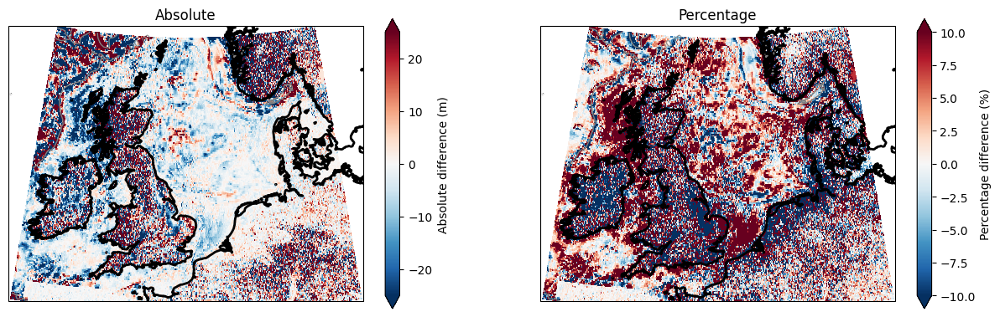

In [19]:
plot_difference(dset, 2008, 2025, step=step, vmax1=25, figsize=figsize)

#### 2008 vs 2014

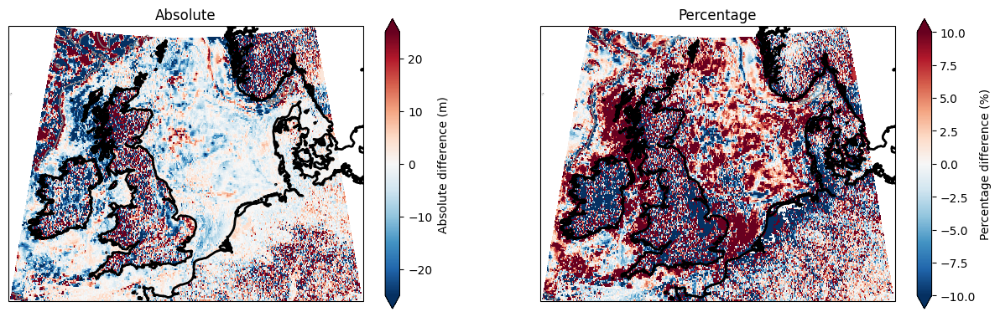

In [20]:
plot_difference(dset, 2008, 2014, step=step, vmax1=25, figsize=figsize)

#### 2014 vs 2019

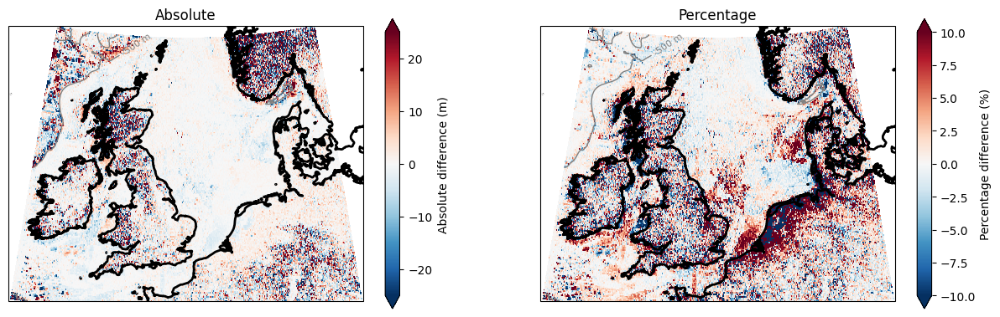

In [21]:
plot_difference(dset, 2014, 2019, step=step, vmax1=25, figsize=figsize)

#### 2019 vs 2020

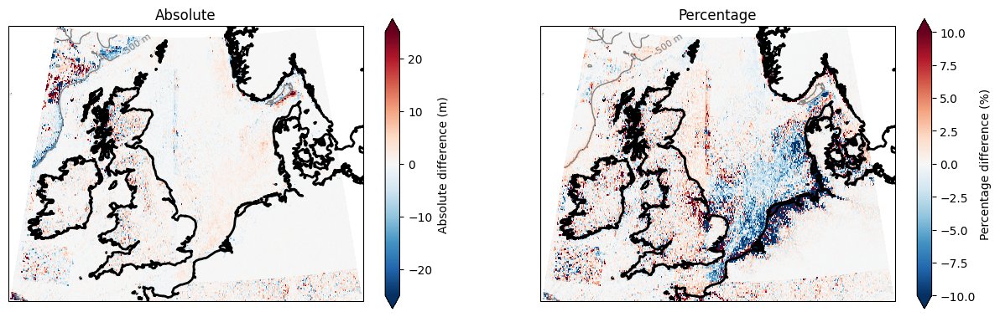

In [22]:
plot_difference(dset, 2019, 2020, step=step, vmax1=25, figsize=figsize)

#### 2020 vs 2021

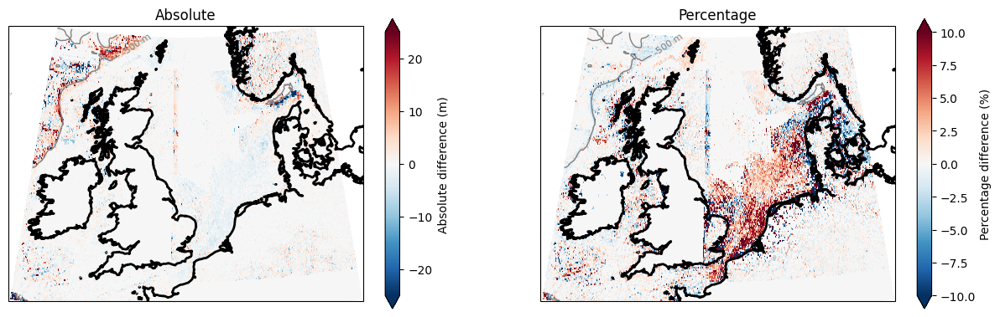

In [23]:
plot_difference(dset, 2020, 2021, step=step, vmax1=25, figsize=figsize)

#### 2021 vs 2022

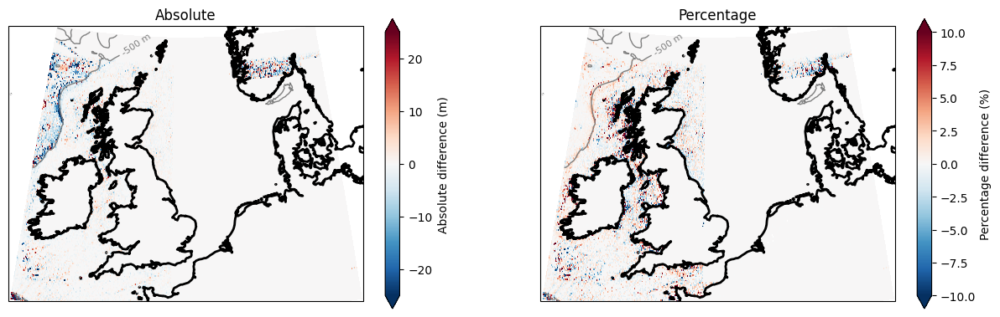

In [24]:
plot_difference(dset, 2021, 2022, step=step, vmax1=25, figsize=figsize)

#### 2022 vs 2023

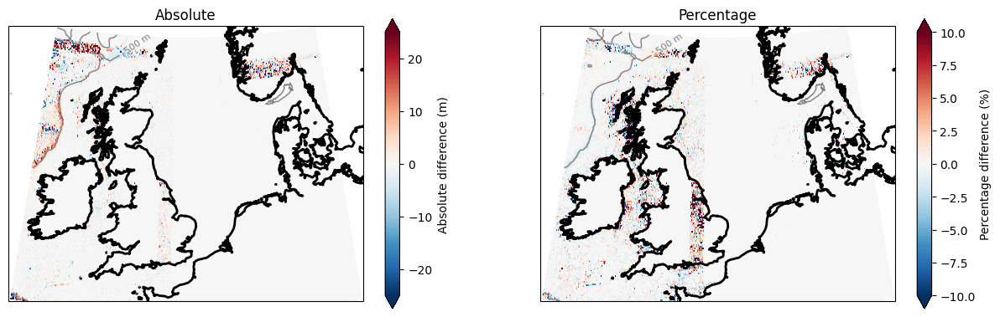

In [25]:
plot_difference(dset, 2022, 2023, step=step, vmax1=25, figsize=figsize)

#### 2023 vs 2024

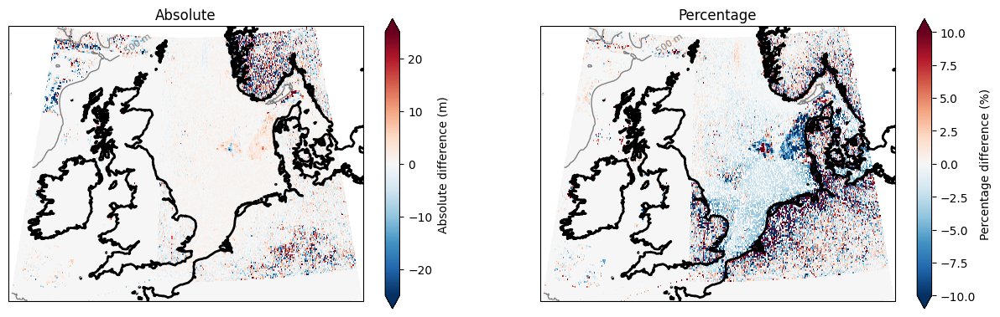

In [26]:
plot_difference(dset, 2023, 2024, step=step, vmax1=25, figsize=figsize)

#### 2024 vs 2025

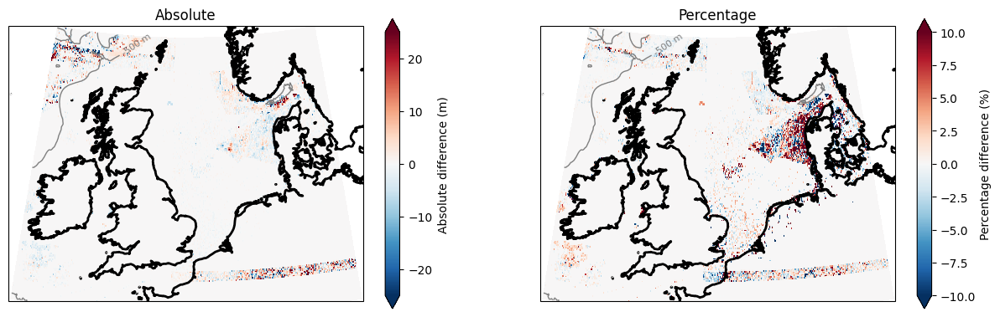

In [27]:
plot_difference(dset, 2024, 2025, step=step, vmax1=25, figsize=figsize)